In [1]:
import numpy as np
import cv2 as cv
import sys
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt
sys.path.insert(0, './')

from scipy.optimize import curve_fit


In [73]:
from OperadorePuntualesEHistogramas import histogram_enhancement
def read_img(path):
    return cv.imread(path)


def show_img(img, ax=plt, figsize=(30,10), **kwargs):
    ax.figure(figsize = figsize)
    ax.imshow(img, **kwargs)
    plt.axis('off')
    
def show_imgs(imgs, figsize=(10,10), cmap='viridis', vmin=0, vmax=255, titles=None):
    figsize = (figsize[0]*len(imgs), figsize[1])
    _, axarr = plt.subplots(1, len(imgs), figsize=figsize, tight_layout=True)
    for i in range(len(imgs)):
        ax = axarr[i]
        ax.imshow(imgs[i], vmin=vmin, vmax=vmax, cmap=cmap)
        ax.axis('off')
        if titles is not None:
            ax.set_title(titles[i])
        
    plt.show()
    

def bgr2rgb(img):
    return cv.cvtColor(img, cv.COLOR_BGR2RGB)

def bgr2hsv(img):
    return cv.cvtColor(img, cv.COLOR_BGR2HSV)
    
def hsv2rgb(img):
    return cv.cvtColor(img, cv.COLOR_HSV2RGB)
    
def three_point_curve(xs, ys):
    def fun(x, a, b, c):
        return a * x**2 + x*b + c
    coef, _ = curve_fit(fun, x, y)
    return lambda x: fun(x, *coef)


# Practica 4 COLOR

## Ej 1: ecualizar imagen sin cambiar el tono ni la saturación del la img

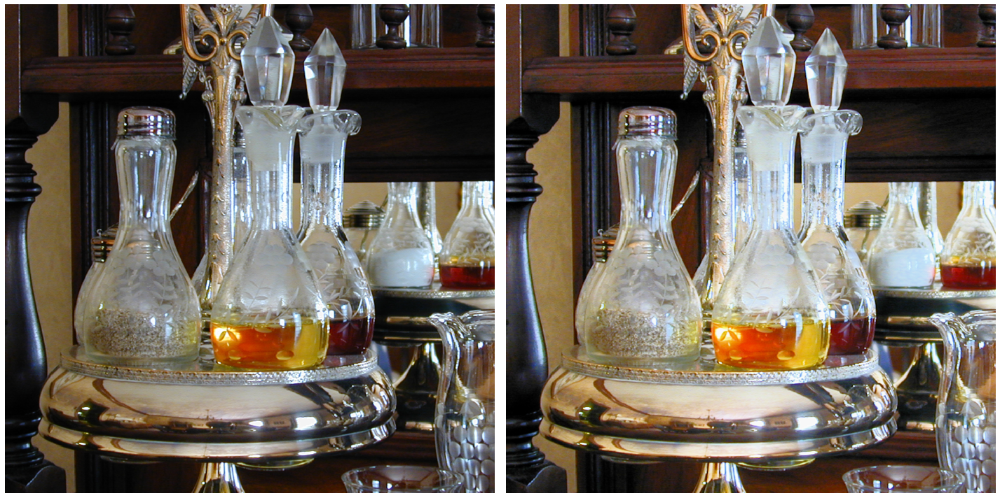

In [100]:
botellas_img = read_img("./imagenes/botellas.tif")
hsv_img = bgr2hsv(botellas_img)
# Modificamos la img
intensity_space = hsv_img[:,:,2]

_, _, new_intensity_space = histogram_enhancement(intensity_space, 0, 0)

hsv_img[:,:,2] = new_intensity_space

show_imgs([bgr2rgb(botellas_img), hsv2rgb(hsv_img)])


In [94]:
def aplicar_transformacion(img, T, max_sat=255):
    shape = img.shape
    flattened_img = img.ravel()
    new_img = (np.array([min(T(pixel), max_sat) for pixel in flattened_img])).reshape(shape)
    return new_img

In [84]:
def constant_T(c):
    return lambda pixel: c * pixel

In [91]:
img_path = "./imagenes/imgClaseColor/"
color_imgs_paths = [f for f in listdir(img_path) if isfile(join(img_path, f))]
color_imgs = [read_img(join(img_path, img)) for img in color_imgs_paths]

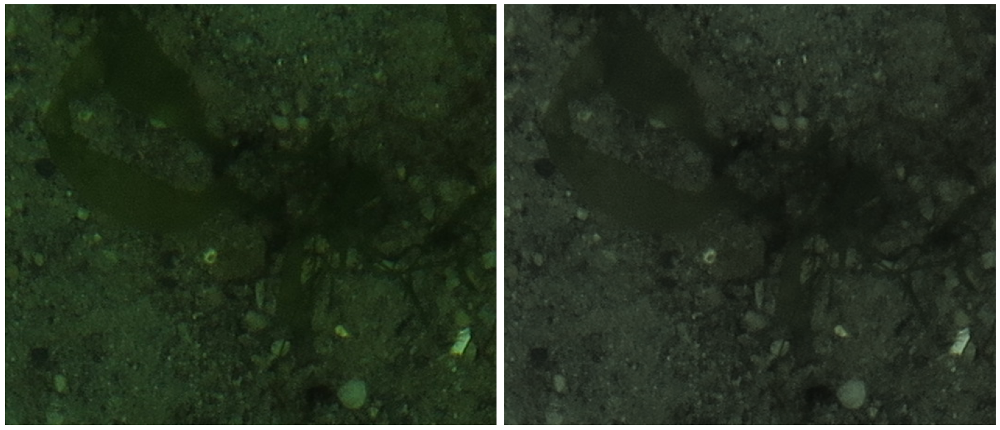

In [103]:
img1 = color_imgs[0]
hsv_img1 = bgr2hsv(img1)
img1_saturation = hsv_img1[:,:,1]
new_saturation = aplicar_transformacion(img1_saturation, constant_T(0.5))
hsv_img1[:,:,1] = new_saturation

show_imgs([bgr2rgb(img1), hsv2rgb(hsv_img1)])

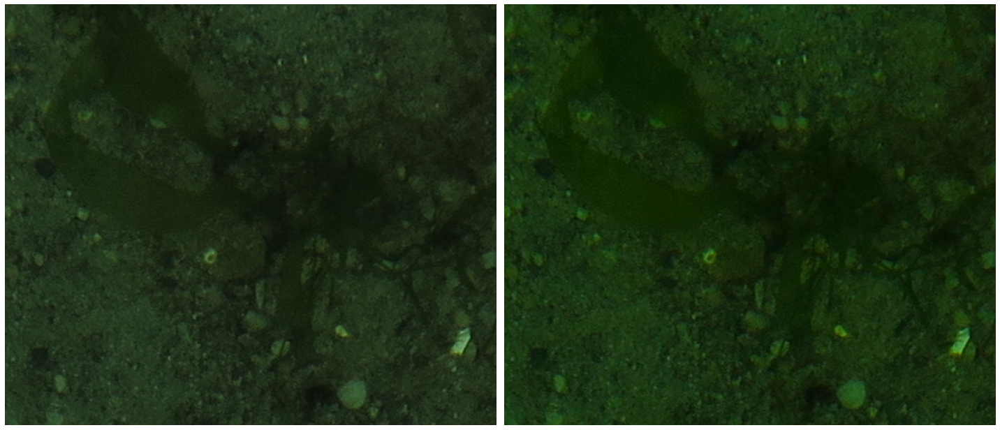

In [105]:
hsv_img1 = bgr2hsv(img1)
img1_saturation = hsv_img1[:,:,1]
new_saturation = aplicar_transformacion(img1_saturation, constant_T(1.5))
hsv_img1[:,:,1] = new_saturation

show_imgs([bgr2rgb(img1), hsv2rgb(hsv_img1)])

/home/awolfsdorf/.pyenv/versions/3.8.0/envs/pdi/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


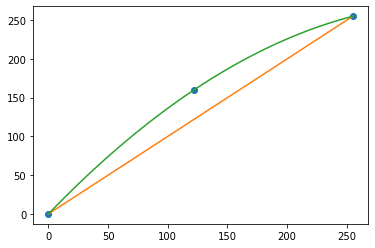

In [131]:
x = [0, 122, 255]
y = [0, 160, 255]

curve = three_point_curve(x, y)
plt.plot(x, y, 'o', label='Original points')
plt.plot(np.linspace(x[0],x[-1]), np.linspace(x[0],x[-1]))
plt.plot(np.linspace(x[0],x[-1]), aplicar_transformacion(np.linspace(x[0],x[-1]), curve))
plt.show()

/home/awolfsdorf/.pyenv/versions/3.8.0/envs/pdi/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


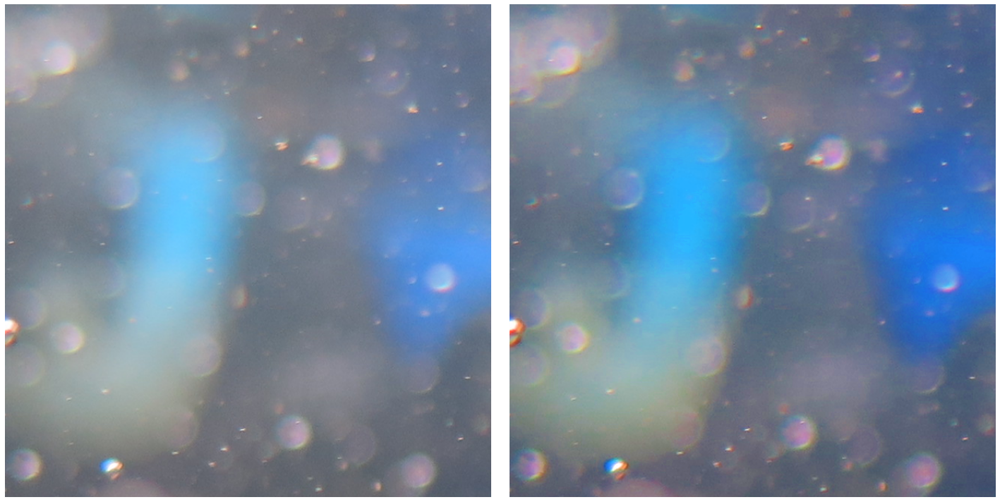

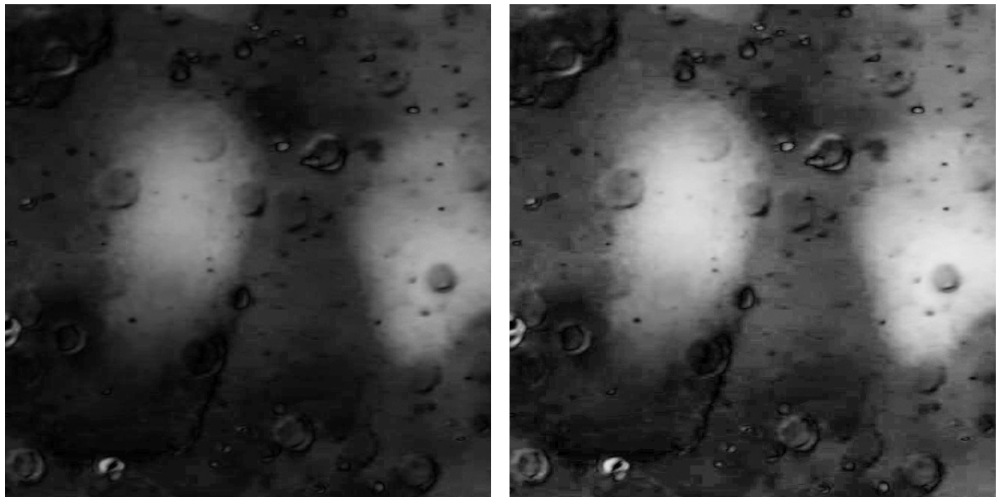

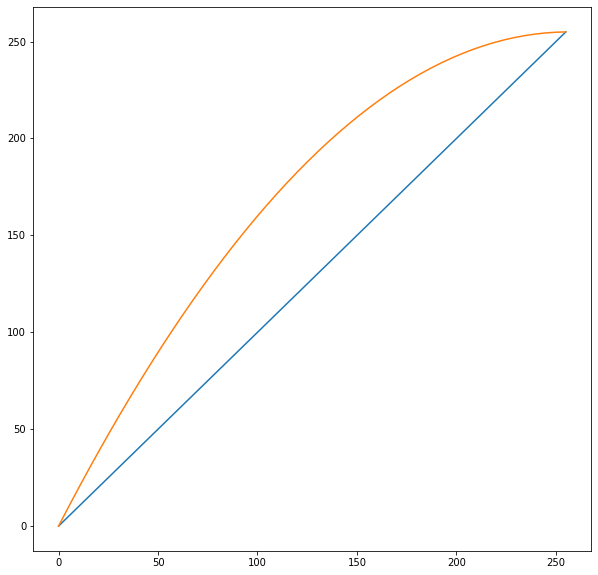

In [165]:
img = color_imgs[-4]
hsv_img = bgr2hsv(img)
img_saturation = np.copy(hsv_img[:,:,1])
x = [0, 100, 255]
y = [0, 160, 255]

curve = three_point_curve(x, y)
new_saturation = aplicar_transformacion(img_saturation, curve)
hsv_img[:,:,1] = new_saturation

show_imgs([bgr2rgb(img), hsv2rgb(hsv_img)])
show_imgs([img_saturation, new_saturation], cmap='gray')
plt.figure(figsize=(10,10))
plt.plot(np.linspace(x[0],x[-1]), np.linspace(x[0],x[-1]))
plt.plot(np.linspace(x[0],x[-1]), aplicar_transformacion(np.linspace(x[0],x[-1]), curve))

/home/awolfsdorf/.pyenv/versions/3.8.0/envs/pdi/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


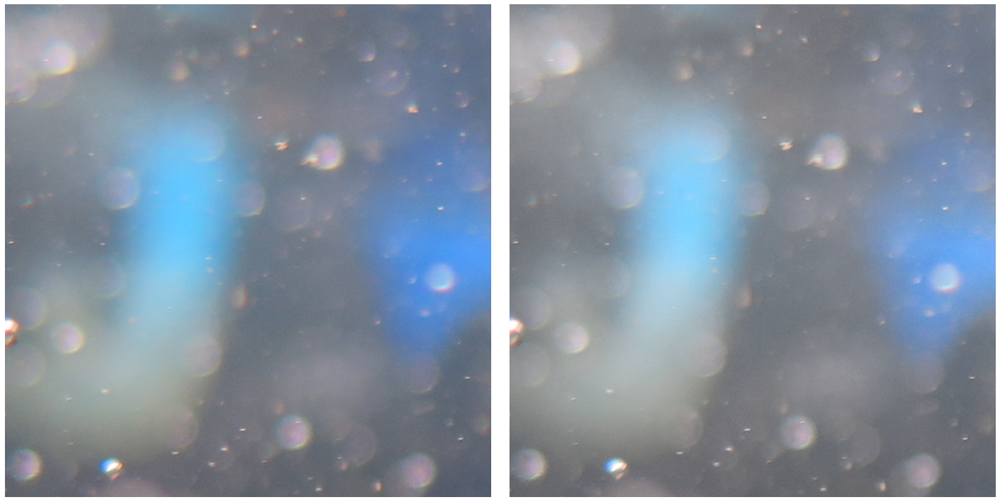

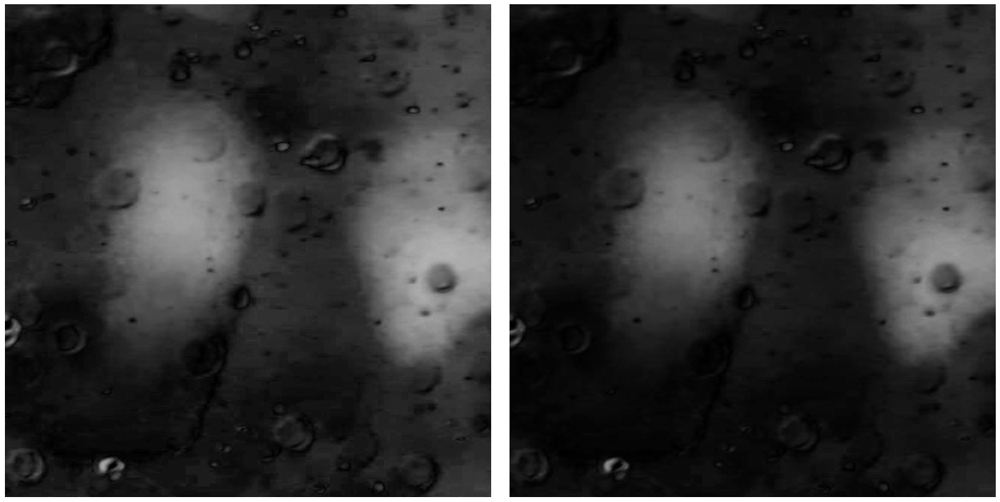

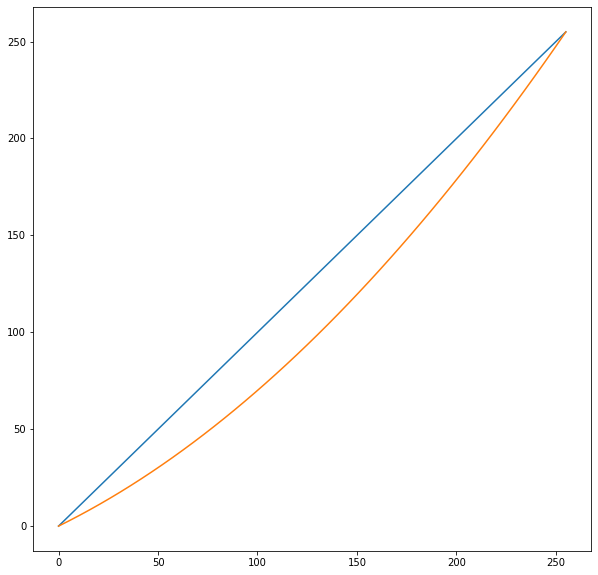

In [166]:
img = color_imgs[-4]
hsv_img = bgr2hsv(img)
img_saturation = np.copy(hsv_img[:,:,1])
x = [0, 100, 255]
y = [0, 70, 255]

curve = three_point_curve(x, y)
new_saturation = aplicar_transformacion(img_saturation, curve)
hsv_img[:,:,1] = new_saturation

show_imgs([bgr2rgb(img), hsv2rgb(hsv_img)])
show_imgs([img_saturation, new_saturation], cmap='gray')
plt.figure(figsize=(10,10))
plt.plot(np.linspace(x[0],x[-1]), np.linspace(x[0],x[-1]))
plt.plot(np.linspace(x[0],x[-1]), aplicar_transformacion(np.linspace(x[0],x[-1]), curve))

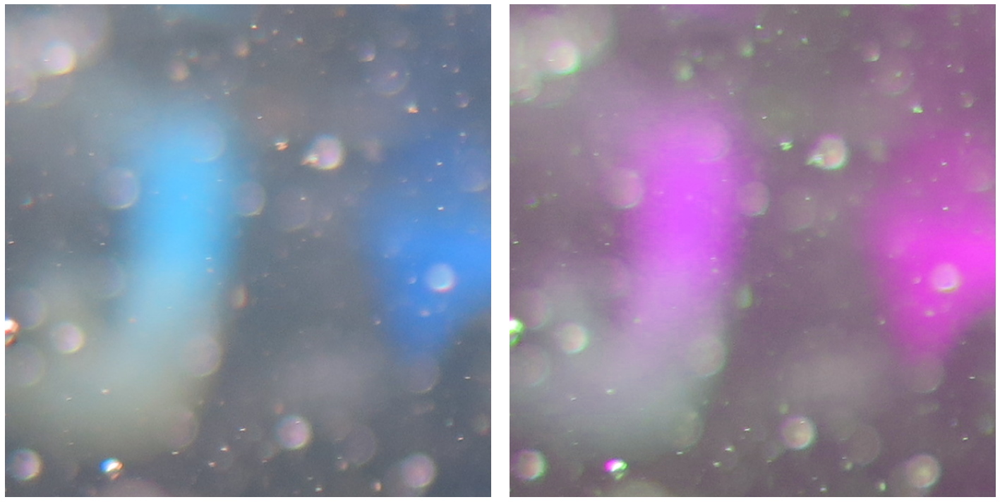

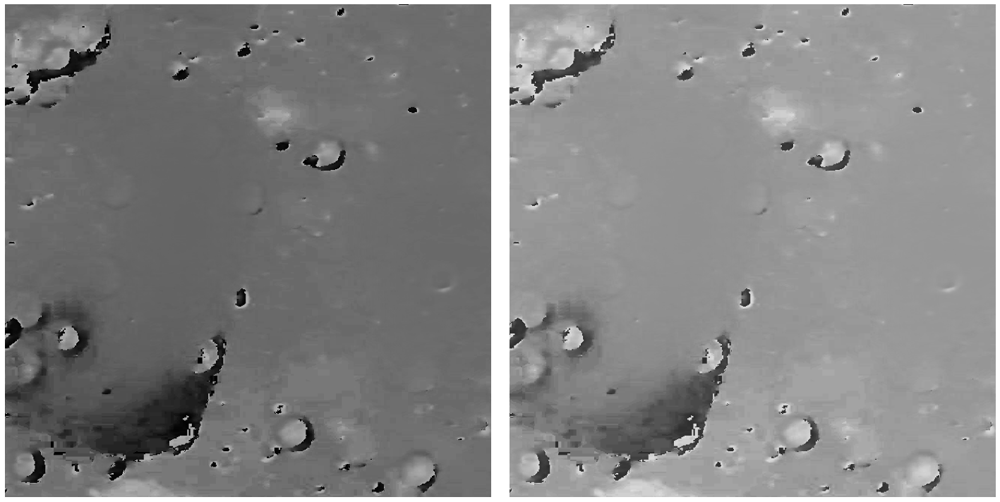

In [186]:
def hue_sum(c):
    return lambda pixel: (pixel + c) % 256

img = color_imgs[11]
hsv_img = bgr2hsv(img)
img_hue = np.copy(hsv_img[:,:,0])

new_hue = aplicar_transformacion(img_hue, hue_sum(300))
hsv_img[:,:,0] = new_hue

show_imgs([bgr2rgb(img), hsv2rgb(hsv_img)])
show_imgs([img_hue, new_hue], cmap='gray')

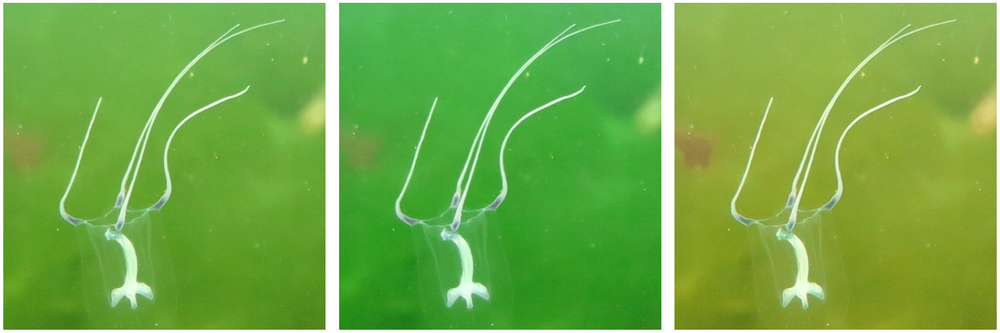

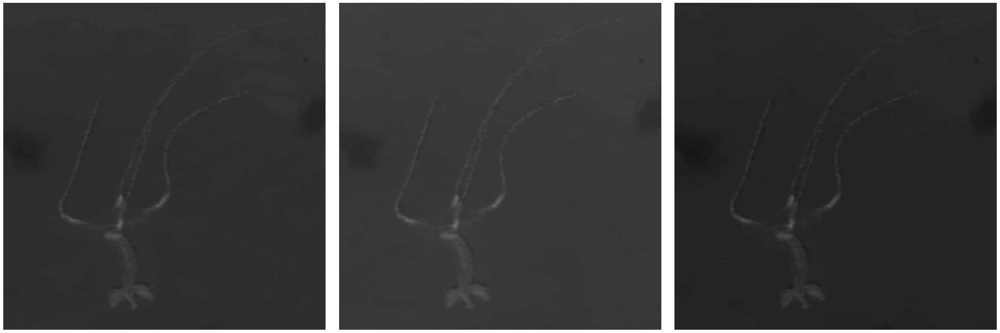

In [185]:
def hue_sum(c):
    return lambda pixel: (pixel + c) % 256

img = color_imgs[11]
hsv_img = bgr2hsv(img)
img_hue = np.copy(hsv_img[:,:,0])

new_hue = aplicar_transformacion(img_hue, hue_sum(10))
new_hue2 = aplicar_transformacion(img_hue, hue_sum(-10))
new_hsv_img1 = np.copy(hsv_img)
new_hsv_img1[:,:,0] = new_hue
new_hsv_img2 = np.copy(hsv_img)
new_hsv_img2[:,:,0] = new_hue2

show_imgs([bgr2rgb(img), hsv2rgb(new_hsv_img1), hsv2rgb(new_hsv_img2)])
show_imgs([img_hue, new_hue, new_hue2], cmap='gray')

## d) Ver en cual de los canales son mas visibles los detalles y en cuales es mas distinguible un granulado en una imagen. Ver a cual de los canales afectan mas los bordes difuminados.

Elegimos 3 imagenes, donde esperamos que se muestren los aspectos que nos piden: detalles, granulado y bordes difuminados

In [212]:
img_detalles = bgr2hsv(color_imgs[3])
img_granulado = bgr2hsv(color_imgs[5])
img_bordes = bgr2hsv(color_imgs[-4])

In [193]:
def get_img_channels(img):
    return img[:,:,0], img[:,:,1], img[:,:,2]

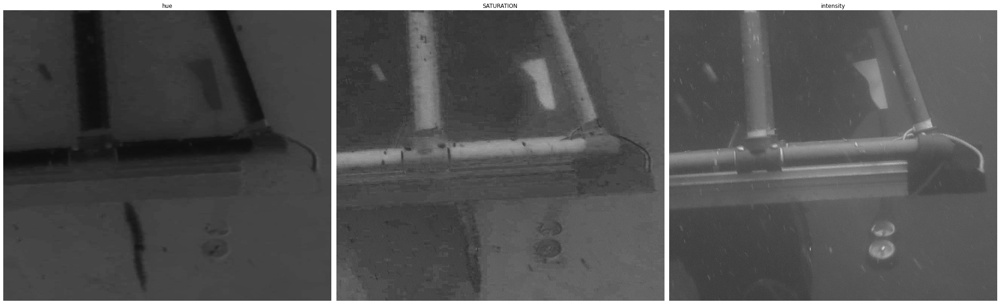

In [216]:
show_imgs(list(get_img_channels(img_detalles)), cmap='gray', titles=["hue", "SATURATION", "intensity"])

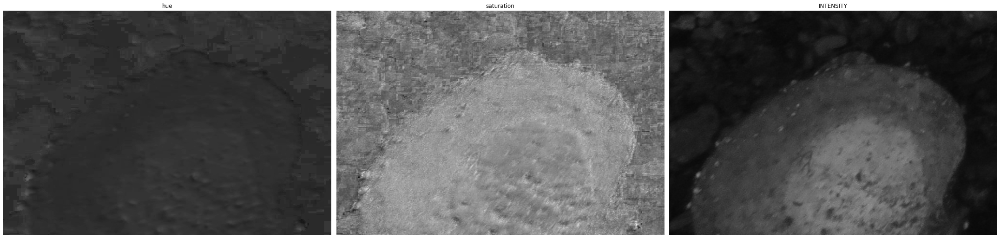

In [217]:
show_imgs(list(get_img_channels(img_granulado)), cmap='gray', titles=["hue", "saturation", "INTENSITY"])

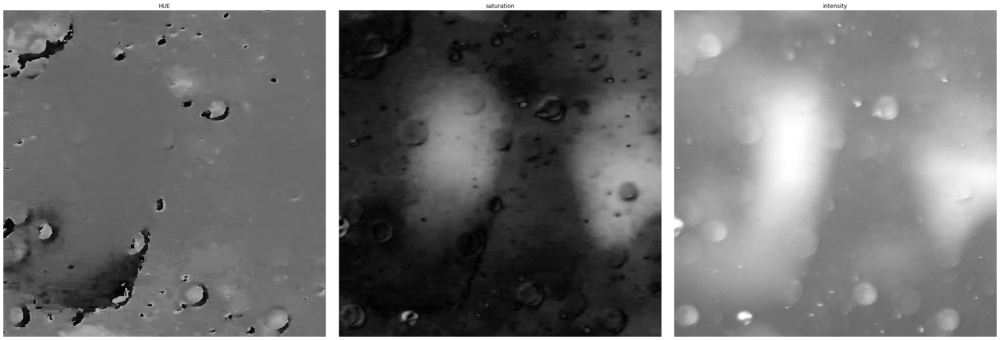

In [218]:
show_imgs(list(get_img_channels(img_bordes)), cmap='gray', titles=["HUE", "saturation", "intensity"])

# Ejercicio 3

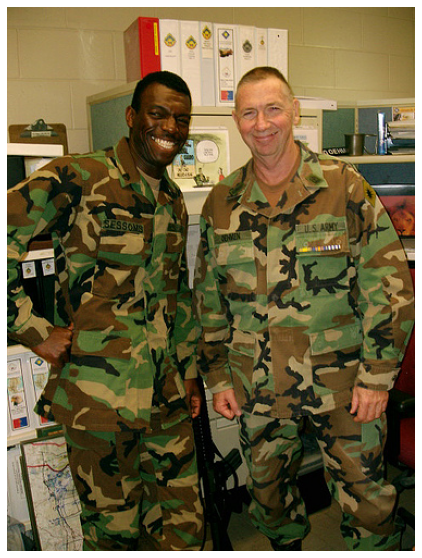

In [4]:
img = read_img('imagenes/2011_003410.jpg')
show_img(bgr2rgb(img))

In [86]:
def detect_color(img, x_start, y_start, x_end, y_end, thresh):
    crop_img = img[y_start:y_end+1, x_start:x_end+1]

    mcolor = np.empty((crop_img.shape[2], crop_img[:,:,0].size))
    for component in range(crop_img.shape[2]):
        mcolor[component] = crop_img[:,:,component].ravel()

    component_means = np.mean(mcolor, axis=1)
    component_cov = np.cov(mcolor)
    i_component_cov = np.linalg.inv(component_cov)

    color_mask = np.zeros((img.shape[0], img.shape[1]));
    for y in range(color_mask.shape[0]):
        for x in range(color_mask.shape[1]):
            z = img[y,x,:]
            color_mask[y,x] = np.sqrt((z - component_means) @ i_component_cov @ (z - component_means).T) < thresh
    
    return color_mask

### Detectar piel con RGB

In [87]:
x_start = 124
y_start = 79
x_end = 163
y_end = 118
thresh = 3
skin1_mask = detect_color(img, x_start, y_start, x_end, y_end, thresh)

x_start = 219
y_start = 74
x_end = 258
y_end = 125
thresh = 3
skin2_mask = detect_color(img, x_start, y_start, x_end, y_end, thresh)

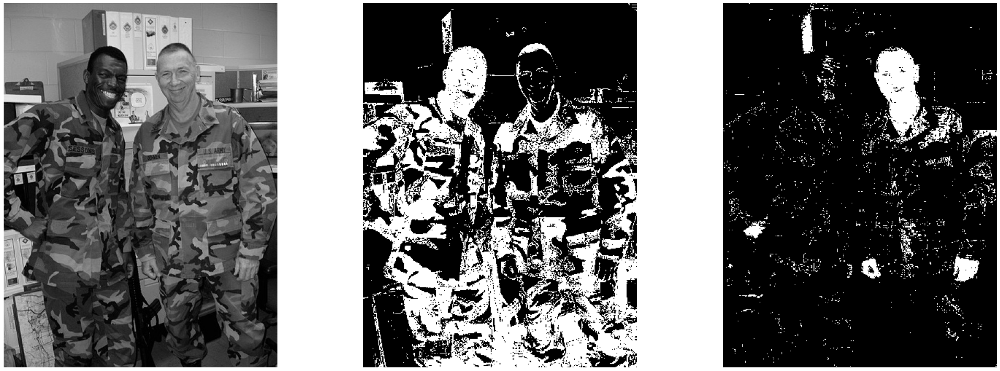

In [88]:
show_imgs([cv.cvtColor(img, cv.COLOR_BGR2GRAY),skin1_mask*255, skin2_mask*255], cmap='gray')

In [90]:
ycbcr_img = cv.cvtColor(img, cv.COLOR_BGR2YCrCb)
cbcr_img = ycbcr_img[:, : , 1:]

### Detectar piel con CbCr

In [95]:
x_start = 124
y_start = 79
x_end = 163
y_end = 118
thresh = 2
skin1_mask = detect_color(cbcr_img, x_start, y_start, x_end, y_end, thresh)

x_start = 219
y_start = 74
x_end = 258
y_end = 125
thresh = 2
skin2_mask = detect_color(cbcr_img, x_start, y_start, x_end, y_end, thresh)

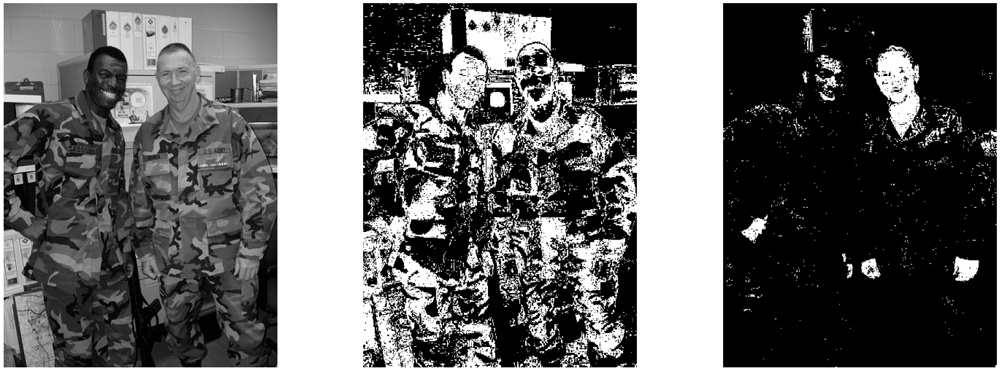

In [96]:
show_imgs([cv.cvtColor(img, cv.COLOR_BGR2GRAY),skin1_mask*255, skin2_mask*255], cmap='gray')

### Detectar piel con YCbCr

In [93]:
x_start = 124
y_start = 79
x_end = 163
y_end = 118
thresh = 3
skin1_mask = detect_color(ycbcr_img, x_start, y_start, x_end, y_end, thresh)

x_start = 219
y_start = 74
x_end = 258
y_end = 125
thresh = 3
skin2_mask = detect_color(ycbcr_img, x_start, y_start, x_end, y_end, thresh)

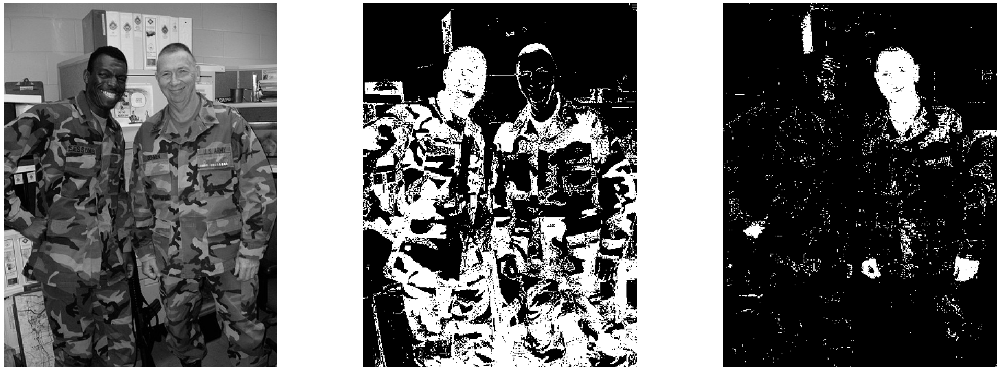

In [94]:
show_imgs([cv.cvtColor(img, cv.COLOR_BGR2GRAY),skin1_mask*255, skin2_mask*255], cmap='gray')